In [ ]:
import torch
from torch import nn, optim
from torchvision import datasets, transforms
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torchvision.utils import save_image
from math import log2
import numpy as np
import os
from tqdm import tqdm
import matplotlib.pyplot as plt

In [ ]:
!pip install kagglehub
import kagglehub

# Download latest version
path = kagglehub.dataset_download("rm1000/brain-tumor-mri-scans")

print("Path to dataset /files:", path)

100%|██████████| 236M/236M [00:01<00:00, 209MB/s]

Extracting files...


Path to dataset /files: /root/.cache/kagglehub/datasets/rm1000/brain-tumor-mri-scans/versions/1


In [ ]:
DATASET                 = "/root/.cache/kagglehub/datasets/rm1000/brain-tumor-mri-scans/versions/1"
START_TRAIN_AT_IMG_SIZE = 8 #The authors start from 8x8 images instead of 4x4
DEVICE                  = "cuda" if torch.cuda.is_available() else "cpu"
LEARNING_RATE           = 1e-3
BATCH_SIZES             = [256, 128, 64, 32, 16, 8]
CHANNELS_IMG            = 3
Z_DIM                   = 256
W_DIM                   = 256
IN_CHANNELS             = 256
LAMBDA_GP               = 10
#PROGRESSIVE_EPOCHS      = [30] * len(BATCH_SIZES)
PROGRESSIVE_EPOCHS      = [5] * len(BATCH_SIZES) #test

In [ ]:
def get_loader(image_size):
    transform = transforms.Compose(
        [
            transforms.Resize((image_size, image_size)),
            transforms.ToTensor(),
            transforms.RandomHorizontalFlip(p=0.5),
            transforms.Normalize(
                [0.5 for _ in range(CHANNELS_IMG)],
                [0.5 for _ in range(CHANNELS_IMG)],
            ),
        ]
    )
    batch_size = BATCH_SIZES[int(log2(image_size / 4))]
    dataset = datasets.ImageFolder(root=DATASET, transform=transform)
    loader = DataLoader(
        dataset,
        batch_size=batch_size,
        shuffle=True,
    )
    return loader, dataset

In [ ]:
factors = [1, 1, 1, 1, 1 / 2, 1 / 4, 1 / 8, 1 / 16, 1 / 32]

In [ ]:
class WSLinear(nn.Module):
    def __init__(
        self, in_features, out_features,
    ):
        super(WSLinear, self).__init__()
        self.linear = nn.Linear(in_features, out_features)
        self.scale = (2 / in_features)**0.5
        self.bias = self.linear.bias
        self.linear.bias = None

        # initialize linear layer
        nn.init.normal_(self.linear.weight)
        nn.init.zeros_(self.bias)

    def forward(self, x):
        return self.linear(x * self.scale) + self.bias

In [ ]:
class MappingNetwork(nn.Module):
    def __init__(self, z_dim, w_dim):
        super().__init__()
        self.mapping = nn.Sequential(
            PixelNorm(),
            WSLinear(z_dim, w_dim),
            nn.ReLU(),
            WSLinear(w_dim, w_dim),
            nn.ReLU(),
            WSLinear(w_dim, w_dim),
            nn.ReLU(),
            WSLinear(w_dim, w_dim),
            nn.ReLU(),
            WSLinear(w_dim, w_dim),
            nn.ReLU(),
            WSLinear(w_dim, w_dim),
            nn.ReLU(),
            WSLinear(w_dim, w_dim),
            nn.ReLU(),
            WSLinear(w_dim, w_dim),
        )

    def forward(self, x):
        return self.mapping(x)

In [ ]:
class AdaIN(nn.Module):
    def __init__(self, channels, w_dim):
        super().__init__()
        self.instance_norm = nn.InstanceNorm2d(channels)
        self.style_scale = WSLinear(w_dim, channels)
        self.style_bias = WSLinear(w_dim, channels)

    def forward(self, x, w):
        x = self.instance_norm(x)
        style_scale = self.style_scale(w).unsqueeze(2).unsqueeze(3)
        style_bias = self.style_bias(w).unsqueeze(2).unsqueeze(3)
        return style_scale * x + style_bias

In [ ]:
class InjectNoise(nn.Module):
    def __init__(self, channels):
        super().__init__()
        self.weight = nn.Parameter(torch.zeros(1, channels, 1, 1))

    def forward(self, x):
        noise = torch.randn((x.shape[0], 1, x.shape[2], x.shape[3]), device=x.device)
        return x + self.weight * noise


In [ ]:
class WSConv2d(nn.Module):
    def __init__(
        self, in_channels, out_channels, kernel_size=3, stride=1, padding=1
    ):
        super(WSConv2d, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding)
        self.scale = (2 / (in_channels * (kernel_size ** 2))) ** 0.5
        self.bias = self.conv.bias
        self.conv.bias = None

        # initialize conv layer
        nn.init.normal_(self.conv.weight)
        nn.init.zeros_(self.bias)

    def forward(self, x):
        return self.conv(x * self.scale) + self.bias.view(1, self.bias.shape[0], 1, 1)

In [ ]:
class PixelNorm(nn.Module):
    def __init__(self):
        super(PixelNorm, self).__init__()
        self.epsilon = 1e-8

    def forward(self, x):
        return x / torch.sqrt(torch.mean(x ** 2, dim=1, keepdim=True) + self.epsilon)

In [ ]:
class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(ConvBlock, self).__init__()
        self.conv1 = WSConv2d(in_channels, out_channels)
        self.conv2 = WSConv2d(out_channels, out_channels)
        self.leaky = nn.LeakyReLU(0.2)

    def forward(self, x):
        x = self.leaky(self.conv1(x))
        x = self.leaky(self.conv2(x))
        return x

In [ ]:
class Discriminator(nn.Module):
    def __init__(self, in_channels, img_channels=3):
        super(Discriminator, self).__init__()
        self.prog_blocks, self.rgb_layers = nn.ModuleList([]), nn.ModuleList([])
        self.leaky = nn.LeakyReLU(0.2)

        # here we work back ways from factors because the discriminator
        # should be mirrored from the generator. So the first prog_block and
        # rgb layer we append will work for input size 1024x1024, then 512->256-> etc
        for i in range(len(factors) - 1, 0, -1):
            conv_in = int(in_channels * factors[i])
            conv_out = int(in_channels * factors[i - 1])
            self.prog_blocks.append(ConvBlock(conv_in, conv_out))
            self.rgb_layers.append(
                WSConv2d(img_channels, conv_in, kernel_size=1, stride=1, padding=0)
            )

        # perhaps confusing name "initial_rgb" this is just the RGB layer for 4x4 input size
        # did this to "mirror" the generator initial_rgb
        self.initial_rgb = WSConv2d(
            img_channels, in_channels, kernel_size=1, stride=1, padding=0
        )
        self.rgb_layers.append(self.initial_rgb)
        self.avg_pool = nn.AvgPool2d(
            kernel_size=2, stride=2
        )  # down sampling using avg pool

        # this is the block for 4x4 input size
        self.final_block = nn.Sequential(
            # +1 to in_channels because we concatenate from MiniBatch std
            WSConv2d(in_channels + 1, in_channels, kernel_size=3, padding=1),
            nn.LeakyReLU(0.2),
            WSConv2d(in_channels, in_channels, kernel_size=4, padding=0, stride=1),
            nn.LeakyReLU(0.2),
            WSConv2d(
                in_channels, 1, kernel_size=1, padding=0, stride=1
            ),  # we use this instead of linear layer
        )

    def fade_in(self, alpha, downscaled, out):
        """Used to fade in downscaled using avg pooling and output from CNN"""
        # alpha should be scalar within [0, 1], and upscale.shape == generated.shape
        return alpha * out + (1 - alpha) * downscaled

    def minibatch_std(self, x):
        batch_statistics = (
            torch.std(x, dim=0).mean().repeat(x.shape[0], 1, x.shape[2], x.shape[3])
        )
        # we take the std for each example (across all channels, and pixels) then we repeat it
        # for a single channel and concatenate it with the image. In this way the discriminator
        # will get information about the variation in the batch/image
        return torch.cat([x, batch_statistics], dim=1)

    def forward(self, x, alpha, steps):
        # where we should start in the list of prog_blocks, maybe a bit confusing but
        # the last is for the 4x4. So example let's say steps=1, then we should start
        # at the second to last because input_size will be 8x8. If steps==0 we just
        # use the final block
        cur_step = len(self.prog_blocks) - steps

        # convert from rgb as initial step, this will depend on
        # the image size (each will have it's on rgb layer)
        out = self.leaky(self.rgb_layers[cur_step](x))

        if steps == 0:  # i.e, image is 4x4
            out = self.minibatch_std(out)
            return self.final_block(out).view(out.shape[0], -1)

        # because prog_blocks might change the channels, for down scale we use rgb_layer
        # from previous/smaller size which in our case correlates to +1 in the indexing
        downscaled = self.leaky(self.rgb_layers[cur_step + 1](self.avg_pool(x)))
        out = self.avg_pool(self.prog_blocks[cur_step](out))

        # the fade_in is done first between the downscaled and the input
        # this is opposite from the generator
        out = self.fade_in(alpha, downscaled, out)

        for step in range(cur_step + 1, len(self.prog_blocks)):
            out = self.prog_blocks[step](out)
            out = self.avg_pool(out)

        out = self.minibatch_std(out)
        return self.final_block(out).view(out.shape[0], -1)

In [ ]:
class GenBlock(nn.Module):
    def __init__(self, in_channels, out_channels, w_dim):
        super(GenBlock, self).__init__()
        self.conv1 = WSConv2d(in_channels, out_channels)
        self.conv2 = WSConv2d(out_channels, out_channels)
        self.leaky = nn.LeakyReLU(0.2, inplace=True)
        self.inject_noise1 = InjectNoise(out_channels)
        self.inject_noise2 = InjectNoise(out_channels)
        self.adain1 = AdaIN(out_channels, w_dim)
        self.adain2 = AdaIN(out_channels, w_dim)

    def forward(self, x, w):
        x = self.adain1(self.leaky(self.inject_noise1(self.conv1(x))), w)
        x = self.adain2(self.leaky(self.inject_noise2(self.conv2(x))), w)
        return x

In [ ]:
class Generator(nn.Module):
    def __init__(self, z_dim, w_dim, in_channels, img_channels=3):
        super(Generator, self).__init__()
        self.starting_constant = nn.Parameter(torch.ones((1, in_channels, 4, 4)))
        self.map = MappingNetwork(z_dim, w_dim)
        self.initial_adain1 = AdaIN(in_channels, w_dim)
        self.initial_adain2 = AdaIN(in_channels, w_dim)
        self.initial_noise1 = InjectNoise(in_channels)
        self.initial_noise2 = InjectNoise(in_channels)
        self.initial_conv = nn.Conv2d(in_channels, in_channels, kernel_size=3, stride=1, padding=1)
        self.leaky = nn.LeakyReLU(0.2, inplace=True)

        self.initial_rgb = WSConv2d(
            in_channels, img_channels, kernel_size=1, stride=1, padding=0
        )
        self.prog_blocks, self.rgb_layers = (
            nn.ModuleList([]),
            nn.ModuleList([self.initial_rgb]),
        )

        for i in range(len(factors) - 1):  # -1 to prevent index error because of factors[i+1]
            conv_in_c = int(in_channels * factors[i])
            conv_out_c = int(in_channels * factors[i + 1])
            self.prog_blocks.append(GenBlock(conv_in_c, conv_out_c, w_dim))
            self.rgb_layers.append(
                WSConv2d(conv_out_c, img_channels, kernel_size=1, stride=1, padding=0)
            )

    def fade_in(self, alpha, upscaled, generated):
        # alpha should be scalar within [0, 1], and upscale.shape == generated.shape
        return torch.tanh(alpha * generated + (1 - alpha) * upscaled)

    def forward(self, noise, alpha, steps):
        w = self.map(noise)
        x = self.initial_adain1(self.initial_noise1(self.starting_constant), w)
        x = self.initial_conv(x)
        out = self.initial_adain2(self.leaky(self.initial_noise2(x)), w)

        if steps == 0:
            return self.initial_rgb(x)

        for step in range(steps):
            upscaled = F.interpolate(out, scale_factor=2, mode="bilinear")
            out = self.prog_blocks[step](upscaled, w)

        # The number of channels in upscale will stay the same, while
        # out which has moved through prog_blocks might change. To ensure
        # we can convert both to rgb we use different rgb_layers
        # (steps-1) and steps for upscaled, out respectively
        final_upscaled = self.rgb_layers[steps - 1](upscaled)
        final_out = self.rgb_layers[steps](out)
        return self.fade_in(alpha, final_upscaled, final_out)

In [ ]:
def generate_examples(gen, steps, n=100):

    gen.eval()
    alpha = 1.0
    for i in range(n):
        with torch.no_grad():
            noise = torch.randn(1, Z_DIM).to(DEVICE)
            img = gen(noise, alpha, steps)
            if not os.path.exists(f'saved_examples/step{steps}'):
                os.makedirs(f'saved_examples/step{steps}')
            save_image(img*0.5+0.5, f"saved_examples/step{steps}/img_{i}.png")
    gen.train()

In [ ]:
def gradient_penalty(critic, real, fake, alpha, train_step, device="cpu"):
    BATCH_SIZE, C, H, W = real.shape
    beta = torch.rand((BATCH_SIZE, 1, 1, 1)).repeat(1, C, H, W).to(device)
    interpolated_images = real * beta + fake.detach() * (1 - beta)
    interpolated_images.requires_grad_(True)

    # Calculate critic scores
    mixed_scores = critic(interpolated_images, alpha, train_step)

    # Take the gradient of the scores with respect to the images
    gradient = torch.autograd.grad(
        inputs=interpolated_images,
        outputs=mixed_scores,
        grad_outputs=torch.ones_like(mixed_scores),
        create_graph=True,
        retain_graph=True,
    )[0]
    gradient = gradient.view(gradient.shape[0], -1)
    gradient_norm = gradient.norm(2, dim=1)
    gradient_penalty = torch.mean((gradient_norm - 1) ** 2)
    return gradient_penalty

In [ ]:
def train_fn(
    critic,
    gen,
    loader,
    dataset,
    step,
    alpha,
    opt_critic,
    opt_gen,
):
    loop = tqdm(loader, leave=True)

    for batch_idx, (real, _) in enumerate(loop):
        real = real.to(DEVICE)
        cur_batch_size = real.shape[0]


        noise = torch.randn(cur_batch_size, Z_DIM).to(DEVICE)

        fake = gen(noise, alpha, step)
        critic_real = critic(real, alpha, step)
        critic_fake = critic(fake.detach(), alpha, step)
        gp = gradient_penalty(critic, real, fake, alpha, step, device=DEVICE)
        loss_critic = (
            -(torch.mean(critic_real) - torch.mean(critic_fake))
            + LAMBDA_GP * gp
            + (0.001 * torch.mean(critic_real ** 2))
        )

        critic.zero_grad()
        loss_critic.backward()
        opt_critic.step()

        gen_fake = critic(fake, alpha, step)
        loss_gen = -torch.mean(gen_fake)

        gen.zero_grad()
        loss_gen.backward()
        opt_gen.step()

        # Update alpha and ensure less than 1
        alpha += cur_batch_size / (
            (PROGRESSIVE_EPOCHS[step] * 0.5) * len(dataset)
        )
        alpha = min(alpha, 1)

        loop.set_postfix(
            gp=gp.item(),
            loss_critic=loss_critic.item(),
        )


    return alpha

In [ ]:
gen = Generator(
        Z_DIM, W_DIM, IN_CHANNELS, img_channels=CHANNELS_IMG
    ).to(DEVICE)
critic = Discriminator(IN_CHANNELS, img_channels=CHANNELS_IMG).to(DEVICE)
# initialize optimizers
opt_gen = optim.Adam([{"params": [param for name, param in gen.named_parameters() if "map" not in name]},
                        {"params": gen.map.parameters(), "lr": 1e-5}], lr=LEARNING_RATE, betas=(0.0, 0.99))
opt_critic = optim.Adam(
    critic.parameters(), lr=LEARNING_RATE, betas=(0.0, 0.99)
)


gen.train()
critic.train()

# start at step that corresponds to img size that we set in config
step = int(log2(START_TRAIN_AT_IMG_SIZE / 4))
for num_epochs in PROGRESSIVE_EPOCHS[step:]:
    alpha = 1e-5   # start with very low alpha
    loader, dataset = get_loader(4 * 2 ** step)
    print(f"Current image size: {4 * 2 ** step}")

    for epoch in range(num_epochs):
        print(f"Epoch [{epoch+1}/{num_epochs}]")
        alpha = train_fn(
            critic,
            gen,
            loader,
            dataset,
            step,
            alpha,
            opt_critic,
            opt_gen
        )

    generate_examples(gen, step)
    step += 1  # progress to the next img size

Current image size: 8
Epoch [1/5]


100%|██████████| 55/55 [00:25<00:00,  2.15it/s, gp=0.0598, loss_critic=-5.71]


Epoch [2/5]


100%|██████████| 55/55 [00:23<00:00,  2.39it/s, gp=0.252, loss_critic=-6.17]


Epoch [3/5]


100%|██████████| 55/55 [00:22<00:00,  2.47it/s, gp=0.11, loss_critic=-6.3]


Epoch [4/5]


100%|██████████| 55/55 [00:22<00:00,  2.40it/s, gp=0.0432, loss_critic=-6.67]


Epoch [5/5]


100%|██████████| 55/55 [00:23<00:00,  2.39it/s, gp=0.0238, loss_critic=-6.06]


Current image size: 16
Epoch [1/5]


100%|██████████| 110/110 [00:35<00:00,  3.12it/s, gp=0.325, loss_critic=-11.9]


Epoch [2/5]


100%|██████████| 110/110 [00:35<00:00,  3.11it/s, gp=0.0185, loss_critic=-10.5]


Epoch [3/5]


100%|██████████| 110/110 [00:35<00:00,  3.11it/s, gp=0.123, loss_critic=-9.7]


Epoch [4/5]


100%|██████████| 110/110 [00:35<00:00,  3.10it/s, gp=0.13, loss_critic=-7.01]


Epoch [5/5]


100%|██████████| 110/110 [00:35<00:00,  3.11it/s, gp=0.128, loss_critic=-8.04]


Current image size: 32
Epoch [1/5]


100%|██████████| 220/220 [01:34<00:00,  2.32it/s, gp=0.286, loss_critic=-11.4]


Epoch [2/5]


100%|██████████| 220/220 [01:35<00:00,  2.29it/s, gp=0.787, loss_critic=-20.7]


Epoch [3/5]


100%|██████████| 220/220 [01:36<00:00,  2.29it/s, gp=0.688, loss_critic=-16.3]


Epoch [4/5]


100%|██████████| 220/220 [01:37<00:00,  2.26it/s, gp=0.383, loss_critic=-15.1]


Epoch [5/5]


100%|██████████| 220/220 [01:36<00:00,  2.27it/s, gp=0.377, loss_critic=-13.7]


Current image size: 64
Epoch [1/5]


100%|██████████| 439/439 [05:40<00:00,  1.29it/s, gp=0.632, loss_critic=-22.3]


Epoch [2/5]


100%|██████████| 439/439 [05:45<00:00,  1.27it/s, gp=0.966, loss_critic=-25.3]


Epoch [3/5]


100%|██████████| 439/439 [05:45<00:00,  1.27it/s, gp=1.21, loss_critic=-19]


Epoch [4/5]


100%|██████████| 439/439 [05:45<00:00,  1.27it/s, gp=0.496, loss_critic=-10.7]


Epoch [5/5]


100%|██████████| 439/439 [05:45<00:00,  1.27it/s, gp=0.499, loss_critic=-15.3]


Current image size: 128
Epoch [1/5]


100%|██████████| 878/878 [11:34<00:00,  1.26it/s, gp=0.761, loss_critic=-29.4]


Epoch [2/5]


100%|██████████| 878/878 [11:34<00:00,  1.26it/s, gp=0.735, loss_critic=-38.3]


Epoch [3/5]


100%|██████████| 878/878 [11:34<00:00,  1.27it/s, gp=0.738, loss_critic=-46.1]


Epoch [4/5]


100%|██████████| 878/878 [11:33<00:00,  1.27it/s, gp=0.254, loss_critic=-19.2]


Epoch [5/5]


100%|██████████| 878/878 [11:33<00:00,  1.27it/s, gp=0.259, loss_critic=-15.6]


No images found for step 0


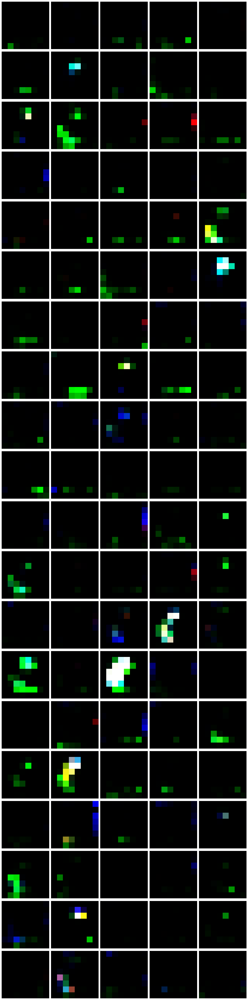

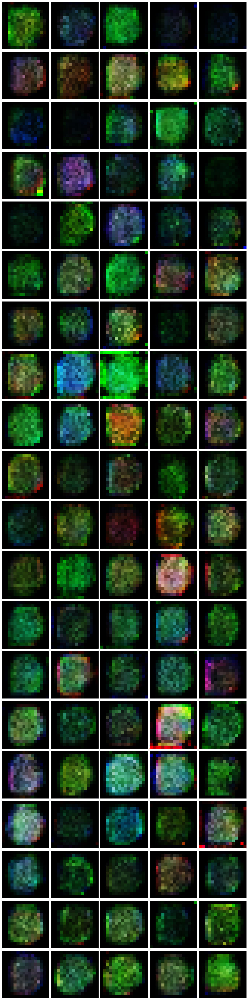

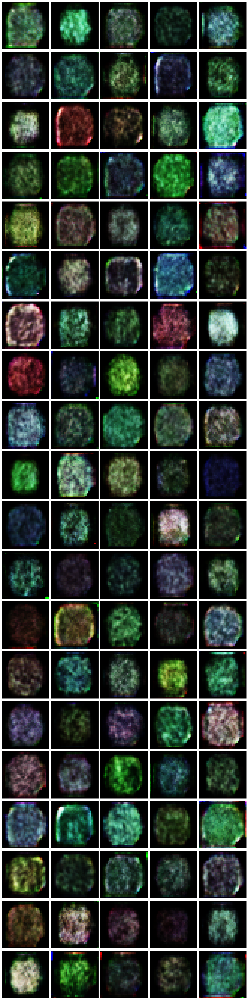

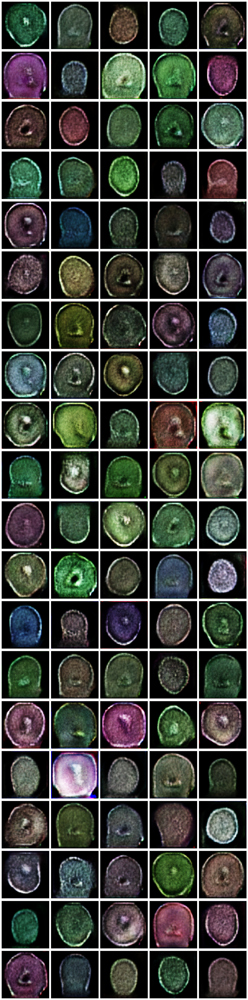

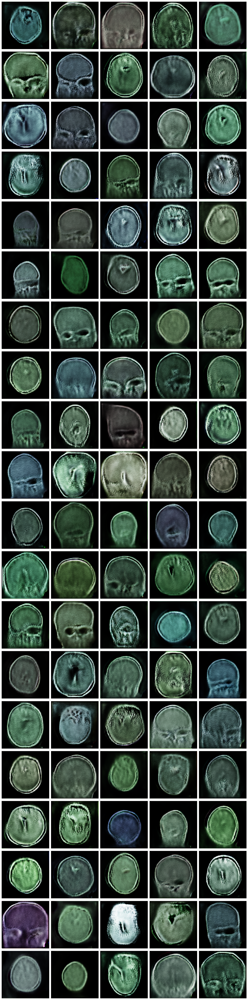

In [ ]:
# prompt: visualize generated images from step 5

import matplotlib.pyplot as plt
import os
from PIL import Image

def visualize_images(step):
    image_dir = f'saved_examples/step{step}'
    if not os.path.exists(image_dir):
        print(f"No images found for step {step}")
        return

    images = [f for f in os.listdir(image_dir) if os.path.isfile(os.path.join(image_dir, f))]
    num_images = len(images)

    # Adjust the number of columns as needed
    num_cols = 5
    num_rows = (num_images + num_cols - 1) // num_cols

    fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 3 * num_rows))

    for i, img_name in enumerate(images):
      row = i // num_cols
      col = i % num_cols

      try:
        img_path = os.path.join(image_dir, img_name)
        img = Image.open(img_path)
        axes[row, col].imshow(img)
        axes[row, col].axis('off')
      except Exception as e:
        print(f"Error loading image {img_name}: {e}")
        axes[row, col].axis('off')

    # Hide any empty subplots
    for i in range(num_images, num_rows * num_cols):
        row = i // num_cols
        col = i % num_cols
        axes[row, col].axis('off')


    plt.tight_layout()
    plt.show()

# Example usage for step 0
visualize_images(0)
visualize_images(1)
visualize_images(2)
visualize_images(3)
visualize_images(4)
visualize_images(5)


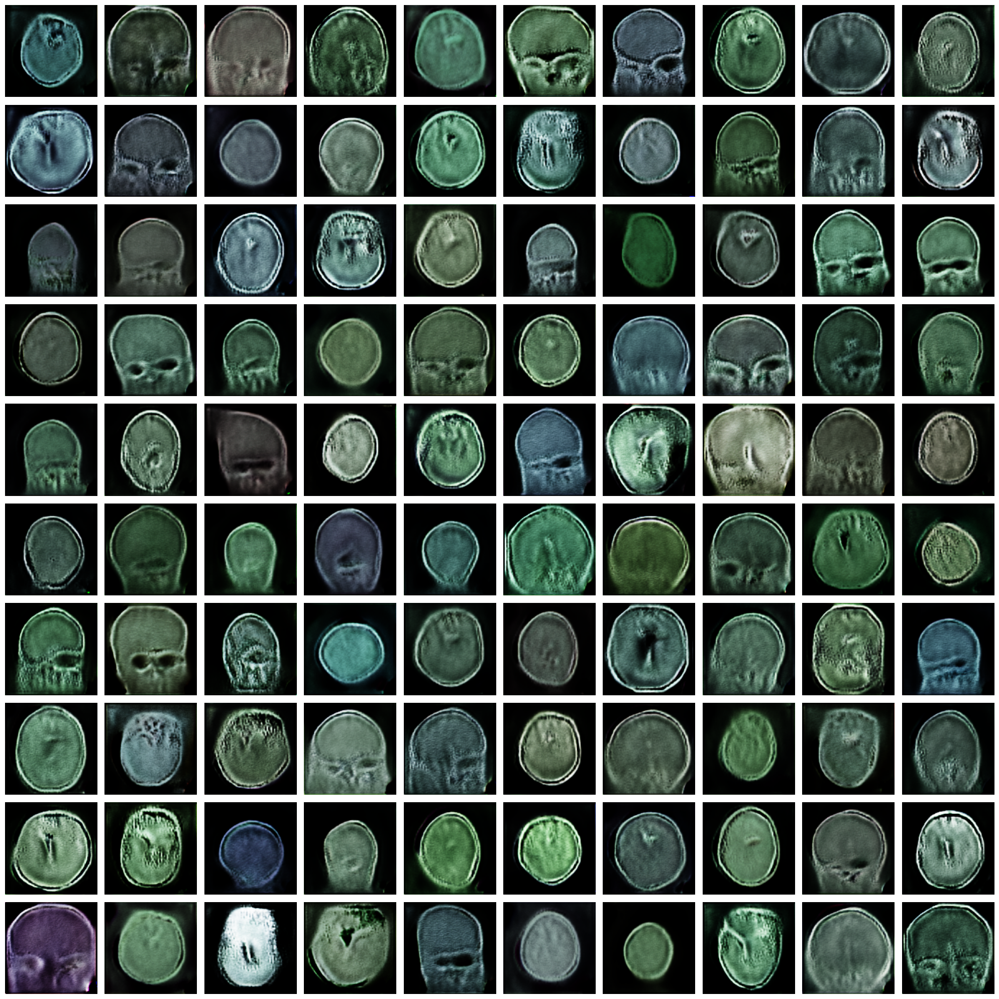

In [26]:
# prompt: visualize generated images from step 30

import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import os

# Specify the directory containing the generated images
image_dir = "saved_examples/step5"  # Replace with the actual directory


# Get a list of image files in the directory
image_files = [f for f in os.listdir(image_dir) if os.path.isfile(os.path.join(image_dir, f))]

# Create a figure and axes for the subplots
fig, axes = plt.subplots(10, 10, figsize=(20, 20))  # Adjust the number of rows and columns as needed

# Iterate over the image files and display them in the subplots
for i, image_file in enumerate(image_files[:100]):  # Display up to 100 images
    if i >= 100:
        break
    img = mpimg.imread(os.path.join(image_dir, image_file))
    row = i // 10
    col = i % 10
    axes[row, col].imshow(img)
    axes[row, col].axis('off')

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

In [ ]:
# prompt: save the models as pht, h5 and pkl

import torch

# Assuming 'gen' and 'critic' are your trained models

# Save as .pth
torch.save(gen.state_dict(), 'generator.pth')
torch.save(critic.state_dict(), 'critic.pth')

# Save as .h5 (requires h5py)
!pip install h5py
import h5py

with h5py.File('generator.h5', 'w') as hf:
    for k, v in gen.state_dict().items():
        hf.create_dataset(k, data=v.cpu().numpy())

with h5py.File('critic.h5', 'w') as hf:
    for k, v in critic.state_dict().items():
        hf.create_dataset(k, data=v.cpu().numpy())

# Save as .pkl
import pickle

with open('generator.pkl', 'wb') as f:
    pickle.dump(gen, f)

with open('critic.pkl', 'wb') as f:
    pickle.dump(critic, f)